In [31]:
!git clone https://github.com/NVlabs/stylegan2-ada-pytorch.git
!cd stylegan2-ada-pytorch


fatal: destination path 'stylegan2-ada-pytorch' already exists and is not an empty directory.


In [32]:
pip install torch torchvision numpy scipy pillow requests dnnlib click tqdm matplotlib


Note: you may need to restart the kernel to use updated packages.


In [33]:
!wget https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl -O ffhq.pkl


--2024-06-20 13:13:56--  https://nvlabs-fi-cdn.nvidia.com/stylegan2-ada-pytorch/pretrained/ffhq.pkl
Resolving nvlabs-fi-cdn.nvidia.com (nvlabs-fi-cdn.nvidia.com)... 3.163.165.123, 3.163.165.95, 3.163.165.26, ...
Connecting to nvlabs-fi-cdn.nvidia.com (nvlabs-fi-cdn.nvidia.com)|3.163.165.123|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 381624121 (364M) [binary/octet-stream]
Saving to: 'ffhq.pkl'

ffhq.pkl            100%[===================>] 363.94M   256MB/s    in 1.4s    

2024-06-20 13:13:58 (256 MB/s) - 'ffhq.pkl' saved [381624121/381624121]



In [34]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

def load_and_preprocess_image(image_path, target_size=(1024, 1024)):
    image = Image.open(image_path).convert('L')
    image = image.resize(target_size, Image.LANCZOS)
    image = np.array(image) / 255.0
    image = np.stack([image]*3, axis=-1)  # Convert to 3 channels
    image = image[np.newaxis, :, :, :]  # Add batch dimension
    return image

def display_image(image_np):
    image_np = np.transpose(image_np, (1, 2, 0))  # Change from CHW to HWC
    plt.imshow(image_np, interpolation='nearest')
    plt.axis('off')
    plt.show()

dataset_path = '/kaggle/input/landscape-image-colorization/landscape Images/gray'
image_paths = [os.path.join(dataset_path, fname) for fname in os.listdir(dataset_path) if fname.endswith('.jpg')]


In [35]:
import sys
sys.path.append("/kaggle/working/stylegan2-ada-pytorch")

In [41]:
import os
import numpy as np
import matplotlib.pyplot as plt
import torch
import dnnlib
import legacy
from PIL import Image

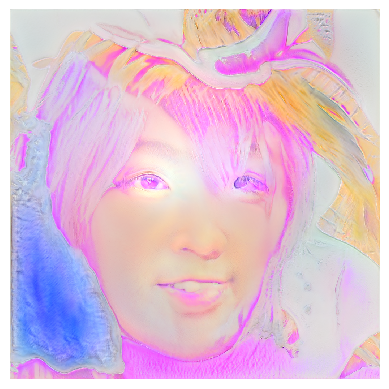

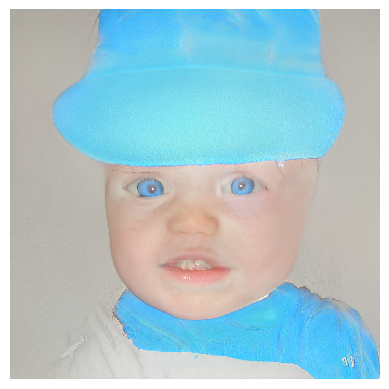

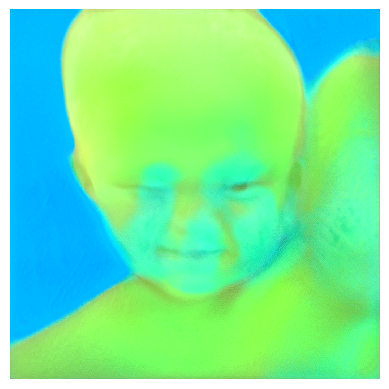

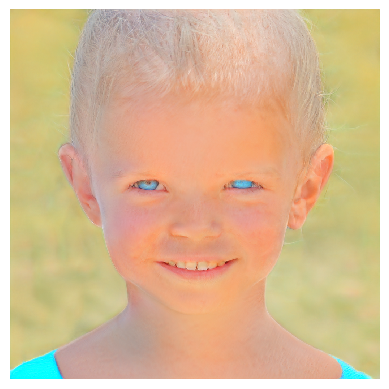

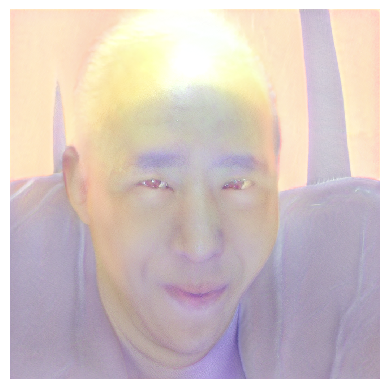

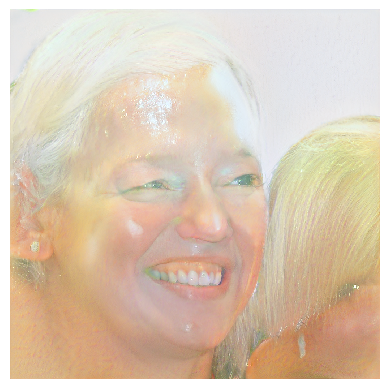

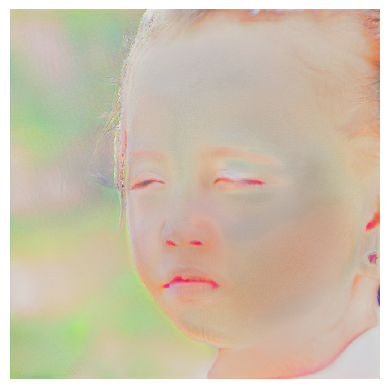

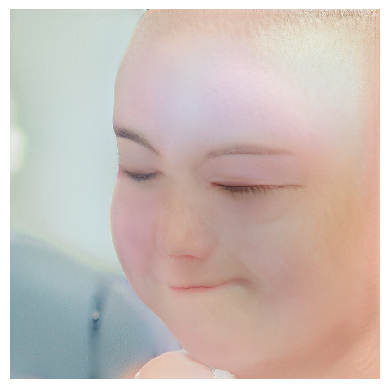

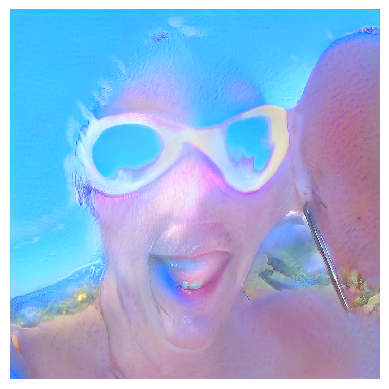

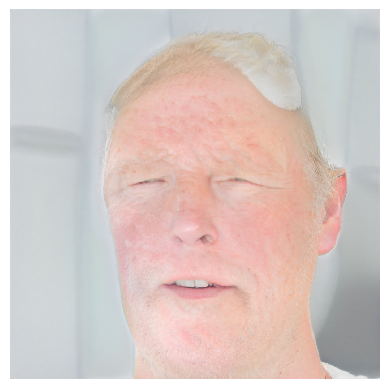

In [58]:
# Function to load and preprocess grayscale images
def load_and_preprocess_image(image_path, target_size=(1024, 1024)):
    image = Image.open(image_path).convert('L')  # Load image as grayscale
    image = image.resize(target_size, Image.LANCZOS)
    image = np.array(image) / 255.0  # Normalize to [0, 1]
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    return image

def display_image(image_np):
    # Ensure image is in range [0, 1]
    image_np = np.clip(image_np, 0, 1)
    
    # Check if the image is grayscale or RGB
    if image_np.shape[0] == 1:
        # Grayscale image (CHW format)
        image_np = np.transpose(image_np.squeeze(), (1, 2, 0))  # Change from CHW to HWC
        plt.imshow(image_np.squeeze(), cmap='gray', interpolation='nearest')
    else:
        # RGB image (NCHW format)
        image_np = np.transpose(image_np.squeeze(), (1, 2, 0))  # Change from NCHW to HWC
        plt.imshow(image_np.clip(0, 1))
        
    plt.axis('off')
    plt.show()



# Load network
def load_networks(network_pkl):
    with open(network_pkl, 'rb') as f:
        G = legacy.load_network_pkl(f)['G_ema'].cuda()  # Load StyleGAN2 model
    return G

# Function to find latent vector
def image_to_latent(G, target_image, num_steps=1000, learning_rate=0.1):
    # Initialize random latent vector
    latent = torch.randn([1, G.z_dim], dtype=torch.float32, device='cuda').requires_grad_(True)
    optimizer = torch.optim.Adam([latent], lr=learning_rate)

    target_image = torch.tensor(target_image, dtype=torch.float32, device='cuda')  # Convert to tensor
    target_image = target_image.unsqueeze(0)  # Add batch dimension

    for step in range(num_steps):
        optimizer.zero_grad()
        ws = G.mapping(latent, None)
        synth_image = G.synthesis(ws, noise_mode='const')
        
        # Convert synth_image to grayscale for comparison
        synth_image_gray = torch.mean(synth_image, dim=1, keepdim=True)  # Convert RGB to grayscale

        loss = torch.nn.functional.mse_loss(synth_image_gray, target_image)
        loss.backward()
        optimizer.step()

    return ws

# Main script
G = load_networks('ffhq.pkl')  # Load StyleGAN2 model
dataset_path = '/kaggle/input/landscape-image-colorization/landscape Images/gray'  # Path to your grayscale images dataset
image_paths = [os.path.join(dataset_path, fname) for fname in os.listdir(dataset_path) if fname.endswith('.jpg')]

# Limit to the first 10 images
image_paths = image_paths[:10]

for image_path in image_paths:
    image = load_and_preprocess_image(image_path)
    ws = image_to_latent(G, image)
    
    with torch.no_grad():
        generated_image = G.synthesis(ws, noise_mode='const')
        generated_image = (generated_image.clamp(-1, 1) + 1) / 2  # Normalize to [0, 1]

    display_image(generated_image.cpu().numpy())


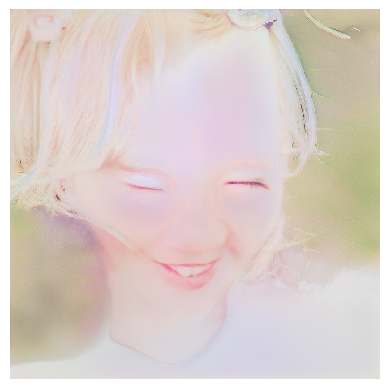

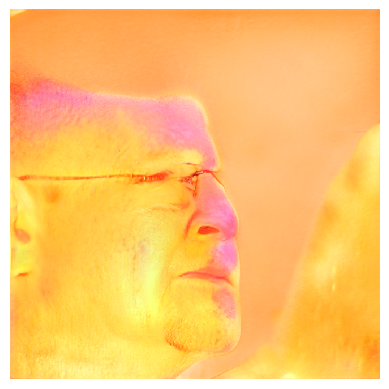

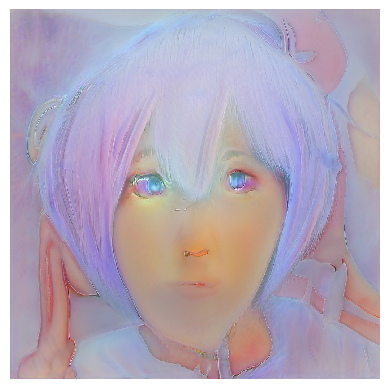

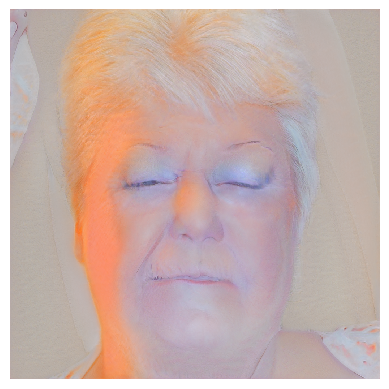

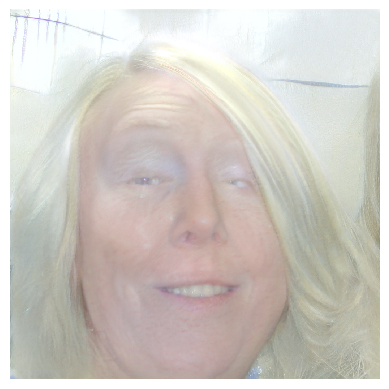

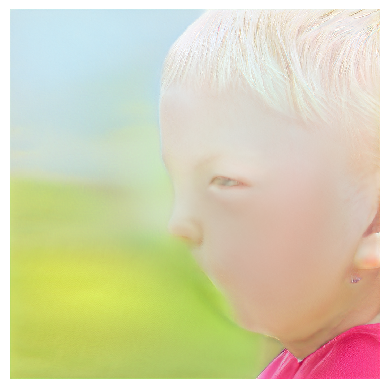

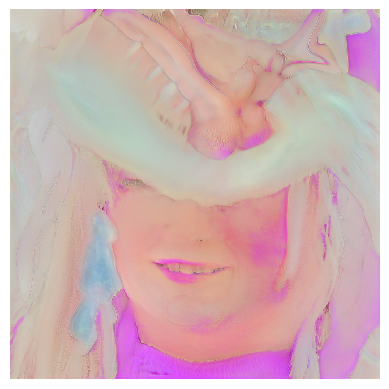

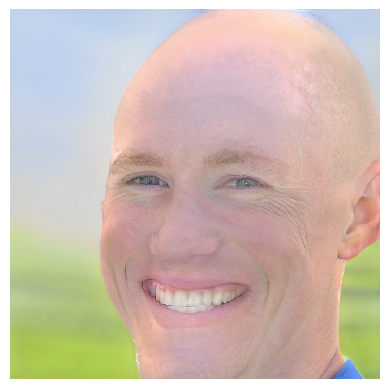

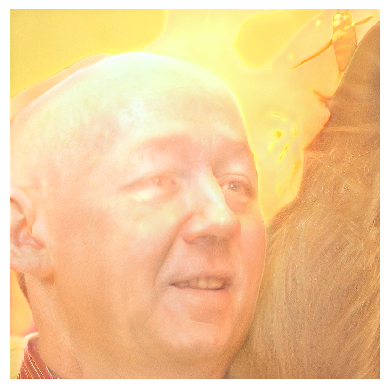

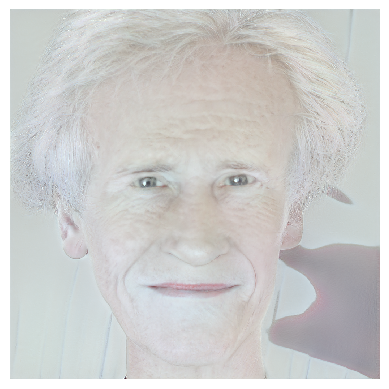

In [59]:
# Function to load and preprocess grayscale images
def load_and_preprocess_image(image_path, target_size=(1024, 1024)):
    image = Image.open(image_path).convert('L')  # Load image as grayscale
    image = image.resize(target_size, Image.LANCZOS)
    image = np.array(image) / 255.0  # Normalize to [0, 1]
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    return image

# Function to display grayscale or RGB images
def display_image(image_np):
    # Ensure image is in range [0, 1]
    image_np = np.clip(image_np, 0, 1)
    
    # Check if the image is grayscale or RGB
    if image_np.shape[0] == 1:
        # Grayscale image (CHW format)
        image_np = np.transpose(image_np.squeeze(), (1, 2, 0))  # Change from CHW to HWC
        plt.imshow(image_np.squeeze(), cmap='gray', interpolation='nearest')
    else:
        # RGB image (NCHW format)
        image_np = np.transpose(image_np.squeeze(), (1, 2, 0))  # Change from NCHW to HWC
        plt.imshow(image_np.clip(0, 1))
        
    plt.axis('off')
    plt.show()

# Load network
def load_networks(network_pkl):
    with open(network_pkl, 'rb') as f:
        G = legacy.load_network_pkl(f)['G_ema'].cuda()  # Load StyleGAN2 model
    return G

# Function to find latent vector
def image_to_latent(G, target_image, num_steps=1000, learning_rate=0.1):
    # Initialize random latent vector
    latent = torch.randn([1, G.z_dim], dtype=torch.float32, device='cuda').requires_grad_(True)
    optimizer = torch.optim.Adam([latent], lr=learning_rate)

    target_image = torch.tensor(target_image, dtype=torch.float32, device='cuda')  # Convert to tensor
    target_image = target_image.unsqueeze(0)  # Add batch dimension

    for step in range(num_steps):
        optimizer.zero_grad()
        ws = G.mapping(latent, None)
        synth_image = G.synthesis(ws, noise_mode='const')
        
        # Convert synth_image to grayscale for comparison
        synth_image_gray = torch.mean(synth_image, dim=1, keepdim=True)  # Convert RGB to grayscale

        loss = torch.nn.functional.mse_loss(synth_image_gray, target_image)
        loss.backward()
        optimizer.step()

    return ws

# Main script
G = load_networks('ffhq.pkl')  # Load StyleGAN2 model
dataset_path = '/kaggle/input/landscape-image-colorization/landscape Images/gray'  # Path to your grayscale images dataset
image_paths = [os.path.join(dataset_path, fname) for fname in os.listdir(dataset_path) if fname.endswith('.jpg')]

# Limit to the first 10 images
image_paths = image_paths[:10]

for image_path in image_paths:
    image = load_and_preprocess_image(image_path)
    ws = image_to_latent(G, image)
    
    with torch.no_grad():
        generated_image = G.synthesis(ws, noise_mode='const')
        generated_image = (generated_image.clamp(-1, 1) + 1) / 2  # Normalize to [0, 1]

    display_image(generated_image.cpu().numpy())


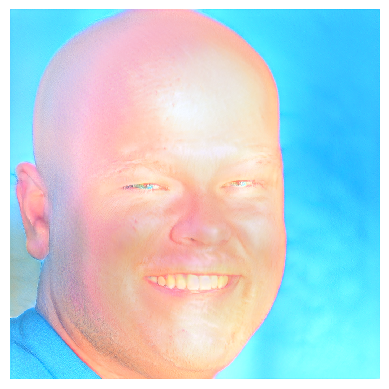

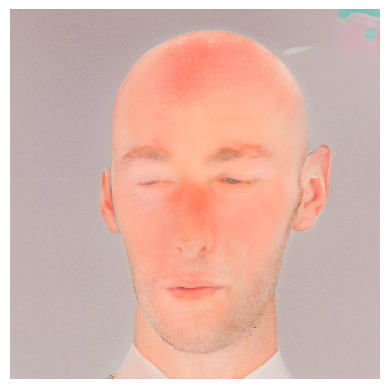

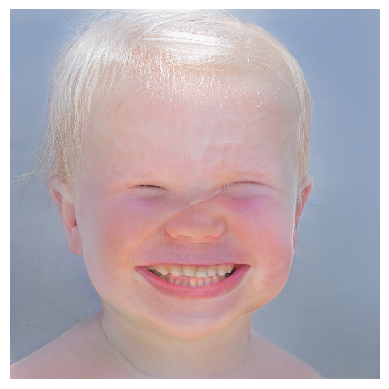

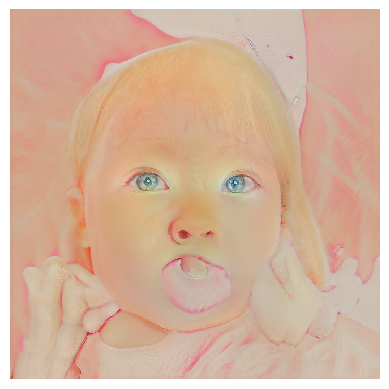

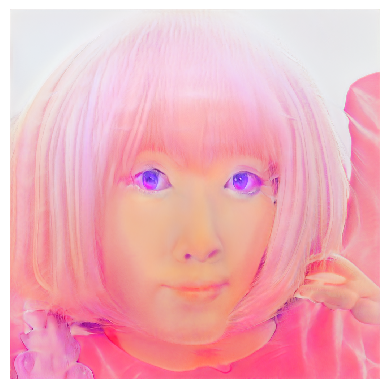

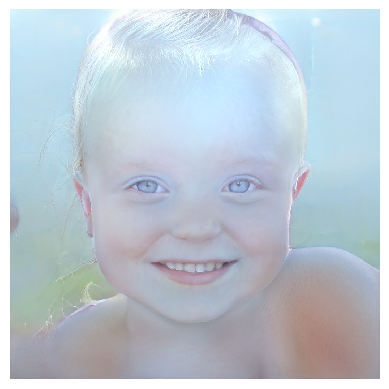

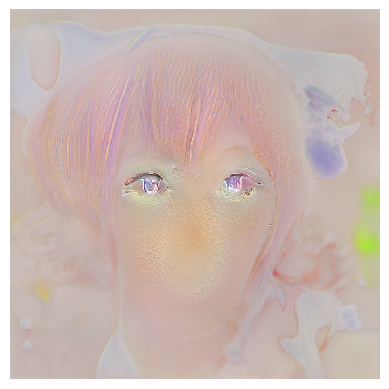

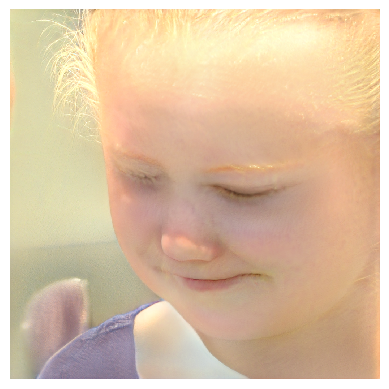

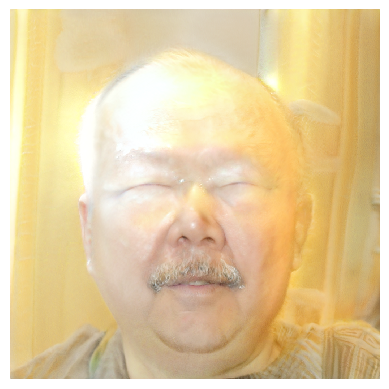

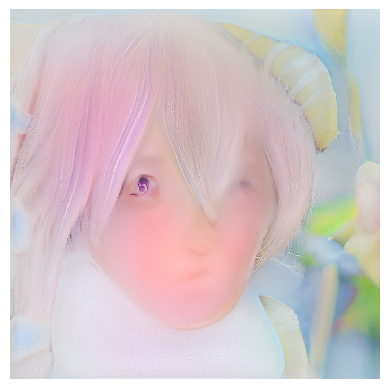

In [60]:
# Function to load and preprocess grayscale images
def load_and_preprocess_image(image_path, target_size=(1024, 1024)):
    image = Image.open(image_path).convert('L')  # Load image as grayscale
    image = image.resize(target_size, Image.LANCZOS)
    image = np.array(image) / 255.0  # Normalize to [0, 1]
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    return image

# Function to display grayscale images
def display_image(image_np):
    # Ensure image is in range [0, 1]
    image_np = np.clip(image_np, 0, 1)
    
    # Grayscale image (CHW format)
    image_np = np.transpose(image_np.squeeze(), (1, 2, 0))  # Change from CHW to HWC
    plt.imshow(image_np.squeeze(), cmap='gray', interpolation='nearest')
    plt.axis('off')
    plt.show()

# Load network
def load_networks(network_pkl):
    with open(network_pkl, 'rb') as f:
        G = legacy.load_network_pkl(f)['G_ema'].cuda()  # Load StyleGAN2 model
    return G

# Function to find latent vector
def image_to_latent(G, target_image, num_steps=1000, learning_rate=0.1):
    # Initialize random latent vector
    latent = torch.randn([1, G.z_dim], dtype=torch.float32, device='cuda').requires_grad_(True)
    optimizer = torch.optim.Adam([latent], lr=learning_rate)

    target_image = torch.tensor(target_image, dtype=torch.float32, device='cuda')  # Convert to tensor
    target_image = target_image.unsqueeze(0)  # Add batch dimension

    for step in range(num_steps):
        optimizer.zero_grad()
        ws = G.mapping(latent, None)
        synth_image = G.synthesis(ws, noise_mode='const')
        
        # Convert synth_image to grayscale for comparison
        synth_image_gray = torch.mean(synth_image, dim=1, keepdim=True)  # Convert RGB to grayscale

        loss = torch.nn.functional.mse_loss(synth_image_gray, target_image)
        loss.backward()
        optimizer.step()

    return ws

# Main script
G = load_networks('ffhq.pkl')  # Load StyleGAN2 model
dataset_path = '/kaggle/input/landscape-image-colorization/landscape Images/gray'  # Path to your grayscale images dataset
image_paths = [os.path.join(dataset_path, fname) for fname in os.listdir(dataset_path) if fname.endswith('.jpg')]

# Limit to the first 10 images
image_paths = image_paths[:10]

for image_path in image_paths:
    image = load_and_preprocess_image(image_path)
    ws = image_to_latent(G, image)
    
    with torch.no_grad():
        generated_image = G.synthesis(ws, noise_mode='const')
        generated_image = (generated_image.clamp(-1, 1) + 1) / 2  # Normalize to [0, 1]

    display_image(generated_image.cpu().numpy())


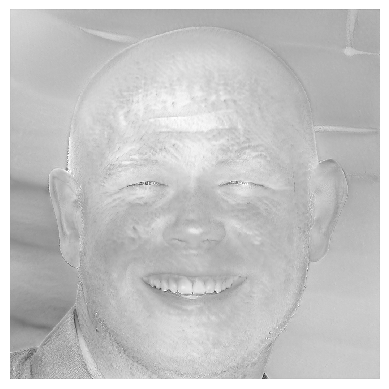

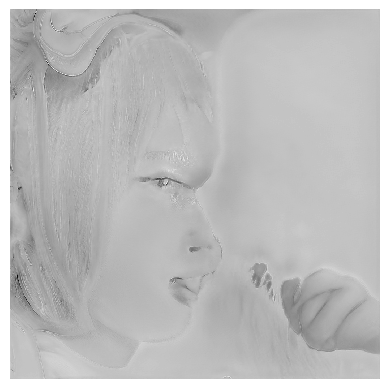

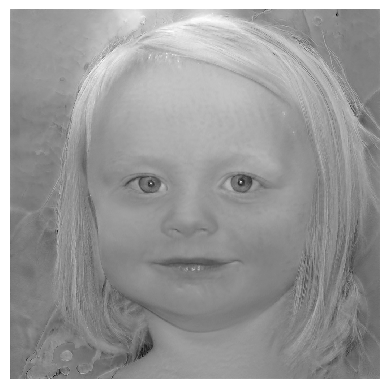

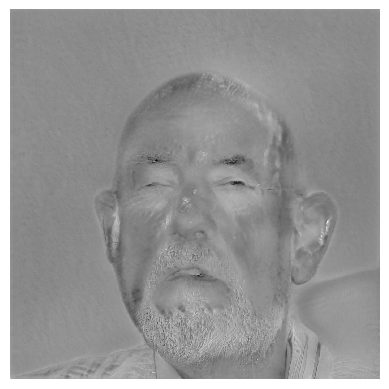

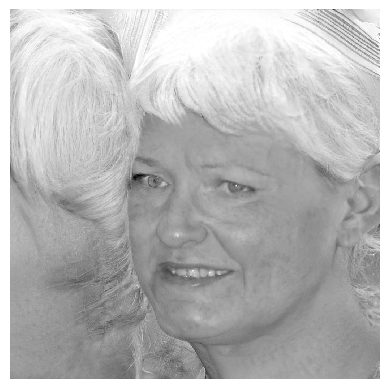

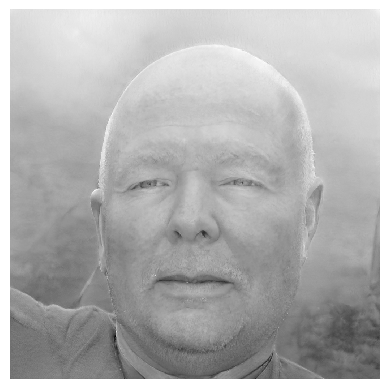

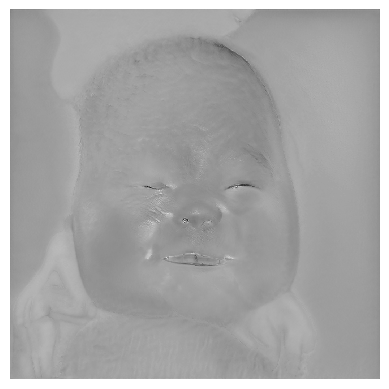

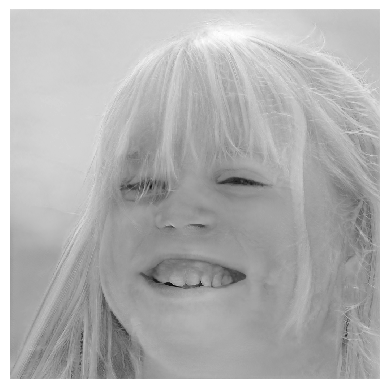

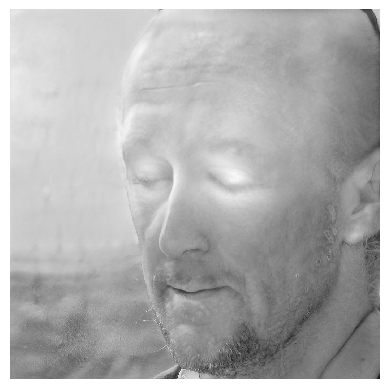

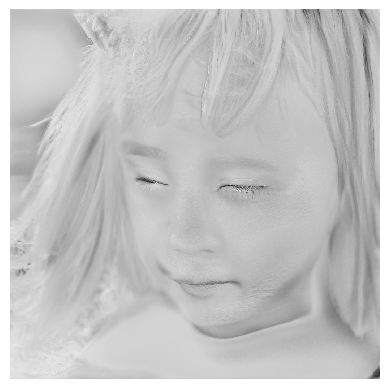

In [64]:
# Function to load and preprocess grayscale images
def load_and_preprocess_image(image_path, target_size=(1024, 1024)):
    image = Image.open(image_path).convert('L')  # Load image as grayscale
    image = image.resize(target_size, Image.LANCZOS)
    image = np.array(image) / 255.0  # Normalize to [0, 1]
    image = np.expand_dims(image, axis=0)  # Add batch dimension
    return image

# Function to display grayscale images
def display_image(image_np):
    # Ensure image is in range [0, 1]
    image_np = np.clip(image_np, 0, 1)
    
    # Display grayscale image
    plt.imshow(image_np.squeeze(), cmap='gray', interpolation='nearest')
    plt.axis('off')
    plt.show()

# Load network
def load_networks(network_pkl):
    with open(network_pkl, 'rb') as f:
        G = legacy.load_network_pkl(f)['G_ema'].cuda()  # Load StyleGAN2 model
    return G

# Function to find latent vector
def image_to_latent(G, target_image, num_steps=1000, learning_rate=0.1):
    # Initialize random latent vector
    latent = torch.randn([1, G.z_dim], dtype=torch.float32, device='cuda').requires_grad_(True)
    optimizer = torch.optim.Adam([latent], lr=learning_rate)

    target_image = torch.tensor(target_image, dtype=torch.float32, device='cuda')  # Convert to tensor
    target_image = target_image.unsqueeze(0)  # Add batch dimension

    for step in range(num_steps):
        optimizer.zero_grad()
        ws = G.mapping(latent, None)
        synth_image = G.synthesis(ws, noise_mode='const')
        
        loss = torch.nn.functional.mse_loss(torch.mean(synth_image, dim=1, keepdim=True), target_image)
        loss.backward()
        optimizer.step()

    return ws

# Main script
G = load_networks('ffhq.pkl')  # Load StyleGAN2 model
dataset_path = '/kaggle/input/landscape-image-colorization/landscape Images/gray'  # Path to your grayscale images dataset
image_paths = [os.path.join(dataset_path, fname) for fname in os.listdir(dataset_path) if fname.endswith('.jpg')]

# Limit to the first 10 images
image_paths = image_paths[:10]

for image_path in image_paths:
    image = load_and_preprocess_image(image_path)
    ws = image_to_latent(G, image)
    
    with torch.no_grad():
        generated_image = G.synthesis(ws, noise_mode='const')
        generated_image = torch.mean(generated_image, dim=1, keepdim=True)  # Convert RGB to grayscale
        generated_image = (generated_image.clamp(-1, 1) + 1) / 2  # Normalize to [0, 1]

    display_image(generated_image.cpu().numpy())

In [67]:
import torch
import torchvision
import numpy
import scipy
import PIL
import requests
import dnnlib
import click
import tqdm
import matplotlib

print(f"torch version: {torch.__version__}")
print(f"torchvision version: {torchvision.__version__}")
print(f"numpy version: {numpy.__version__}")
print(f"PIL (Pillow) version: {PIL.__version__}")
print(f"requests version: {requests.__version__}")
#print(f"dnnlib version: {dnnlib.__version__}")
print(f"click version: {click.__version__}")
print(f"tqdm version: {tqdm.__version__}")
print(f"matplotlib version: {matplotlib.__version__}")


torch version: 2.1.2
torchvision version: 0.16.2
numpy version: 1.26.4
PIL (Pillow) version: 9.5.0
requests version: 2.32.3
click version: 8.1.7
tqdm version: 4.66.4
matplotlib version: 3.7.5
